In [1]:
import os
import sys
from pathlib import Path
sys.path.append(os.path.join(os.path.dirname(os.getcwd()), 'src'))

import cv2
import numpy as np
import matplotlib.pyplot as plt
import itertools
plt.rcParams["figure.figsize"] = (24,18)

from cv_utils import *
from houghlines_process import *

/media/khoa-ys/Personal/Projects/Football Analysis/Football-analysis/data/images/real_test/000000000070.png
(1440, 2560, 3)


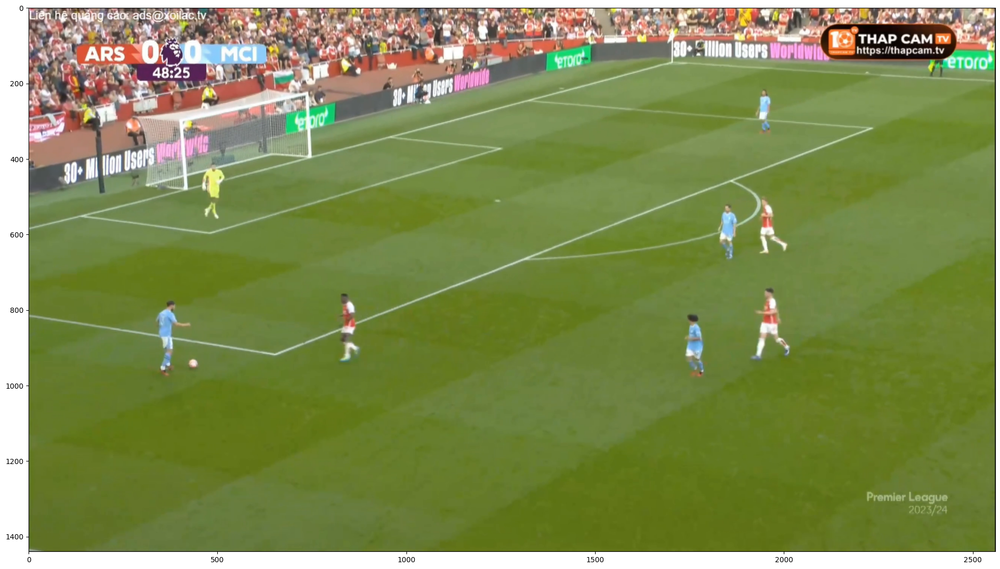

In [2]:
data_path = os.path.join(os.path.dirname(os.getcwd()), 'data')
vid_name = 'real_test'
images_path = os.path.join(data_path, 'images' + '/' + vid_name)

image_path = os.path.join(images_path, '000000000070.png')#sorted(os.listdir(images_path))[8])
print(image_path)
rgb_image = cv2.imread(image_path, cv2.COLOR_BGR2RGB)
print(rgb_image.shape)

plt.figure()
plt.imshow(rgb_image[:,:,::-1])

### Crop pitch

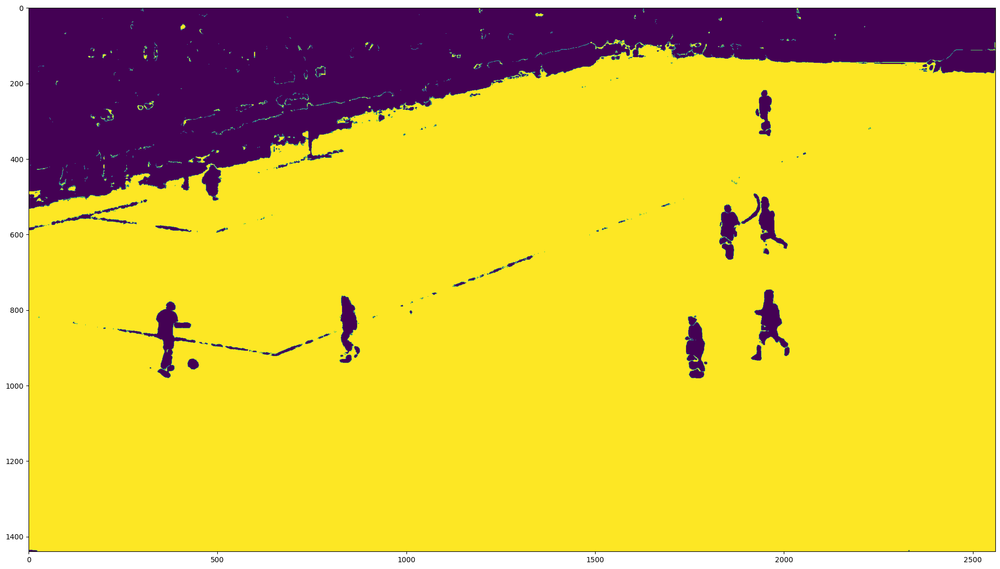

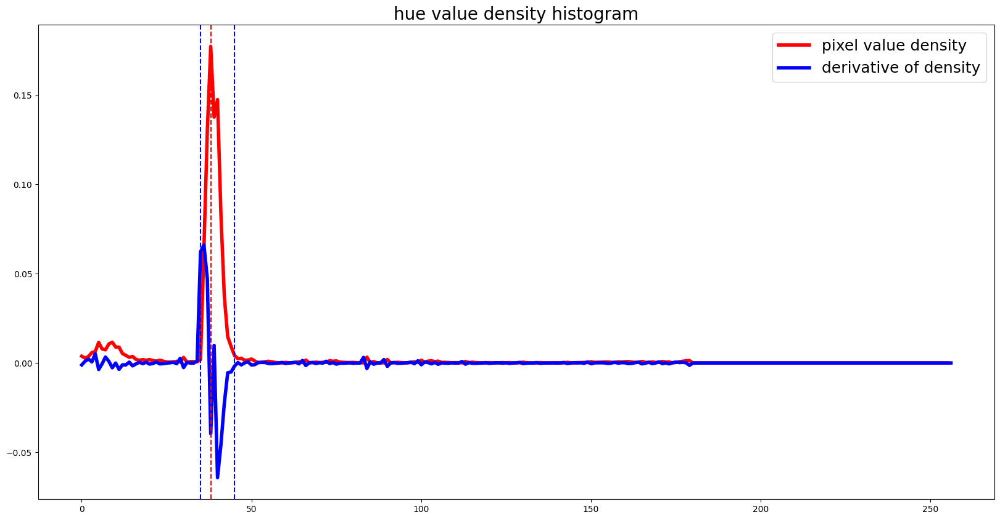

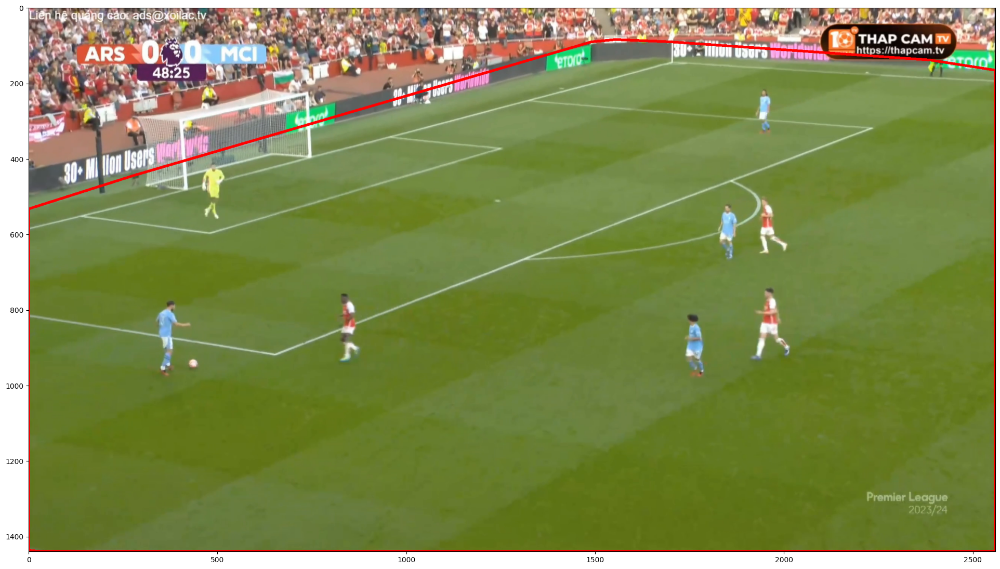

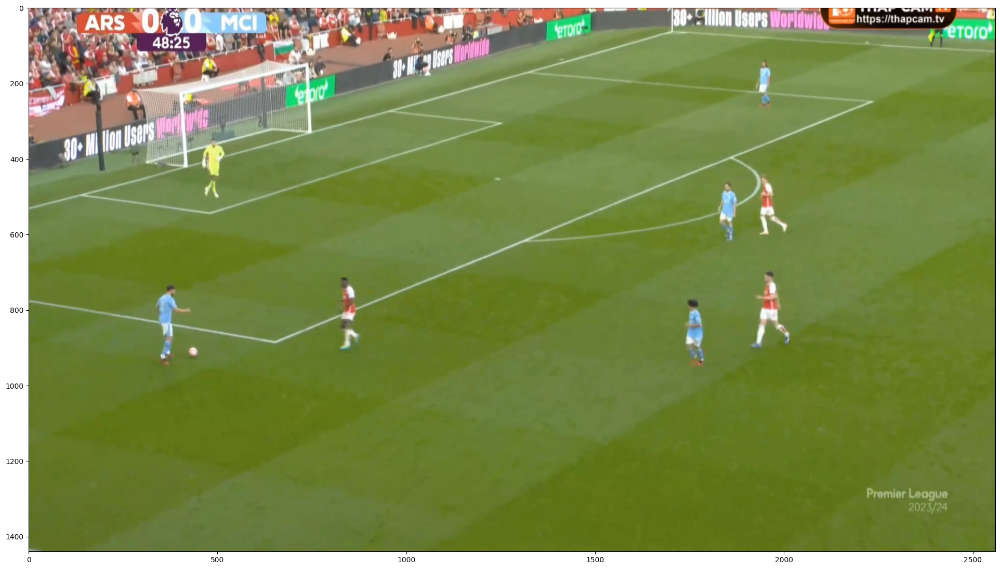

In [3]:
cropped_image = pitch_segment(rgb_image, visualize=True)
orig_h, orig_w, _ = cropped_image.shape

plt.figure()
plt.imshow(cropped_image[:, :, ::-1])

### Filter green pixel

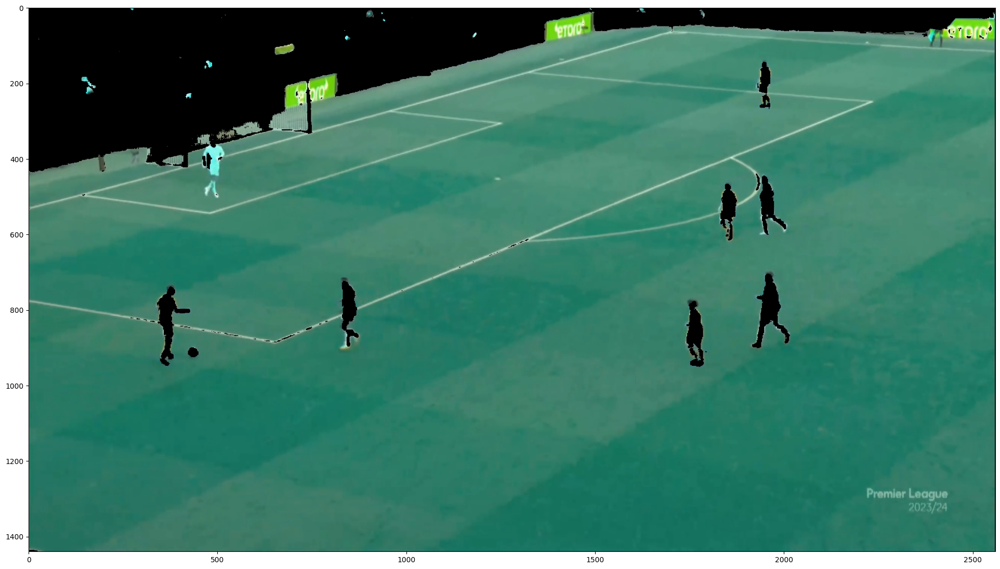

In [4]:
temp = cropped_image.copy()

hsv_image = cv2.cvtColor(temp, cv2.COLOR_BGR2HSV)
lower_green = (30, 40, 40)  # Example lower HSV values for green
upper_green = (90, 255, 255)  # Example upper HSV values for green

mask = cv2.inRange(hsv_image, lower_green, upper_green)
filtered_green = cv2.bitwise_and(temp, temp, mask=mask)

plt.imshow(filtered_green)

### Canny Edge detection

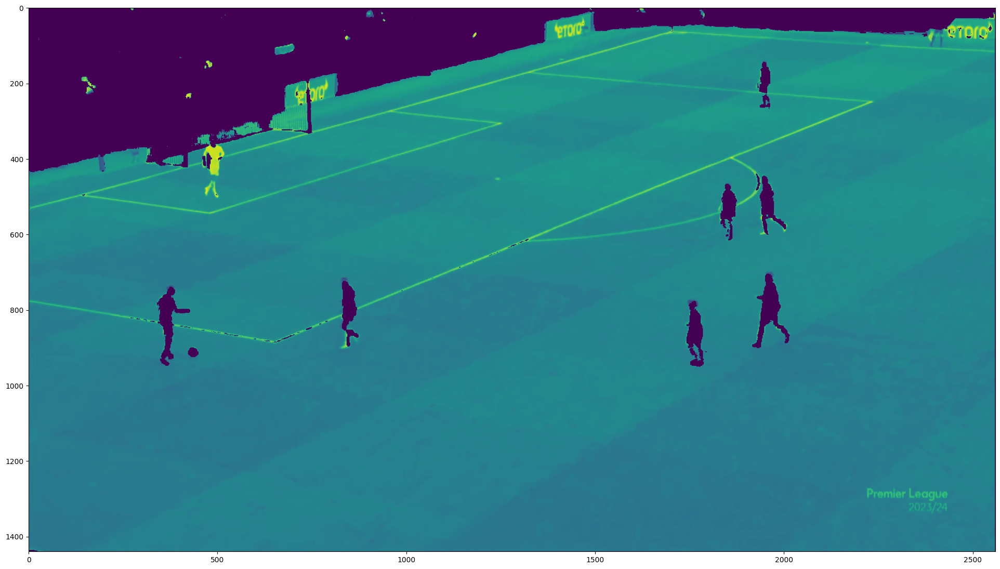

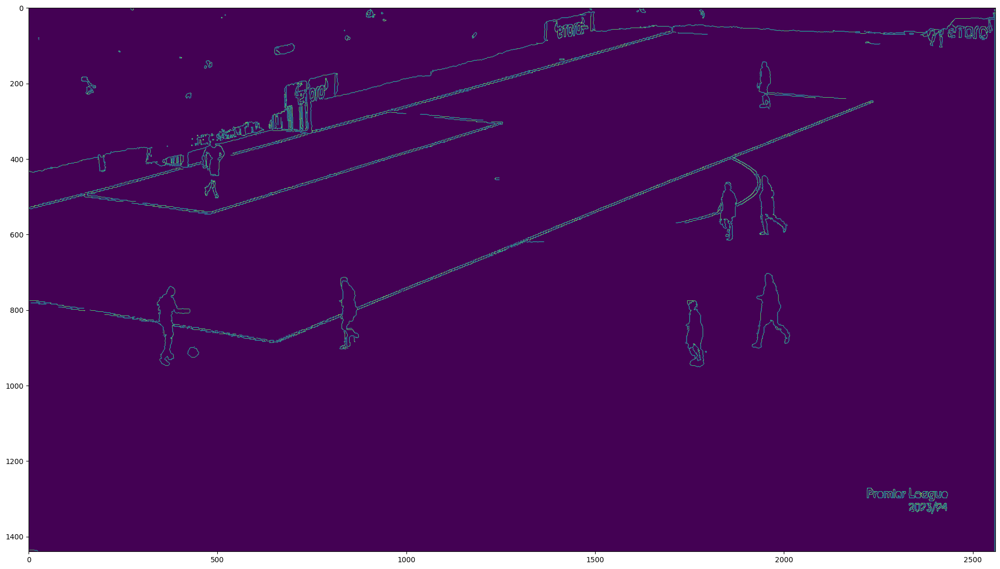

In [21]:
# Canny Edge detection
gray_image = cv2.cvtColor(filtered_green, cv2.COLOR_BGR2GRAY)
plt.figure()
plt.imshow(gray_image)

sigma = 0.5
v = np.median(gray_image)
lower = int(max(0, (1.0 - sigma) * v)) - 20
upper = int(min(255, (1.0 + sigma) * v))

kernel = np.ones((5, 5), np.uint8) 

process_cropped_image = cv2.medianBlur(cv2.dilate(gray_image, kernel, iterations=1), 3)
edges = cv2.Canny(gray_image, lower, upper)

plt.figure()
plt.imshow(edges)

### Hough transform

#### Vanilla Hough transform

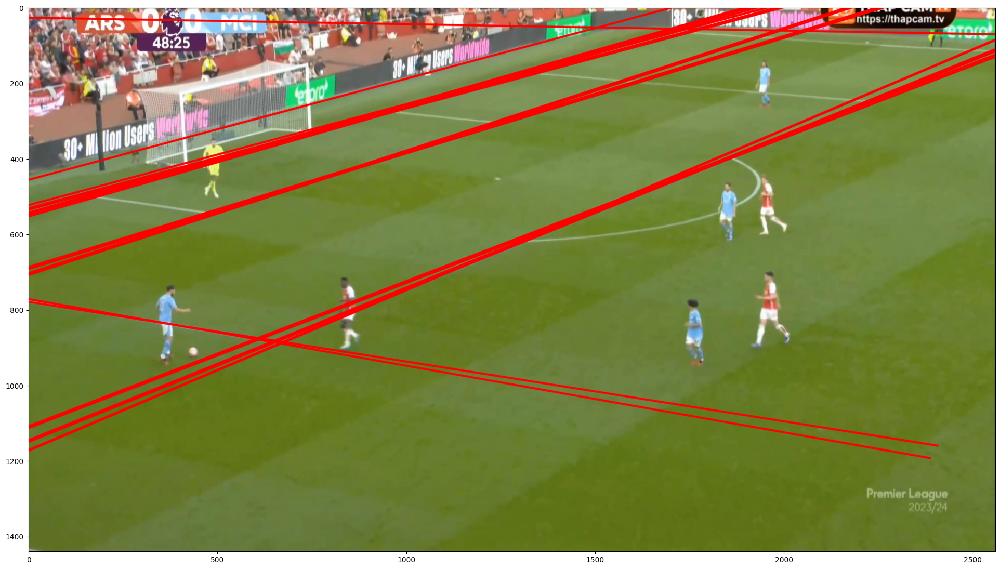

In [24]:
lines = cv2.HoughLines(edges, 1, np.pi / 180, 180)
temp = cropped_image.copy()

if lines is not None:
    for i in range(0, len(lines)):
        rho = lines[i][0][0]
        theta = lines[i][0][1]
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho
            
        points = line_end_points_on_image(rho, theta, (orig_h, orig_w))
        if len(points) == 2:
            pt1, pt2 = points
            pt2 = (int(x0 - orig_w*(-b)), int(y0 - orig_w*(a)))
            cv2.line(temp, pt1, pt2, (0,0,255), 3, cv2.LINE_AA)

plt.figure()
plt.imshow(temp[:,:,::-1])

#### HoughLines with de-duplication and line filter based on Convex Hull

-0.32754010695187163 433.0


(array([  0, 433]),
 array([748, 188], dtype=int32),
 1.3245598026962146,
 31,
 array([   0, 1435], dtype=int32),
 0.0)

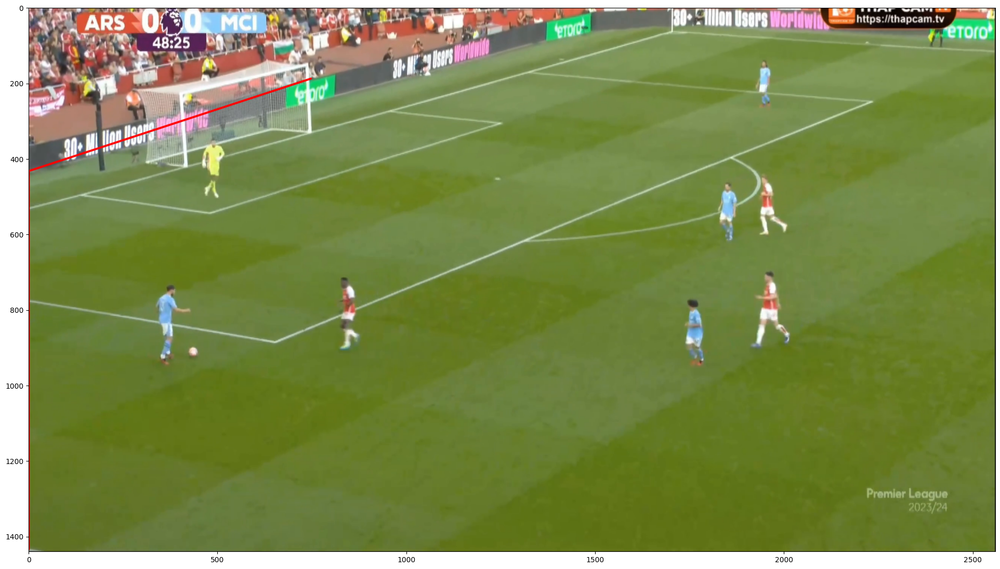

In [7]:
# We utilize convext hull to find the angles of the border lines of the pitch relatively to the image
# These info will be used as reference for Hough transform results

# First we find the starting coordinate (which should have the smallest x, y pair)

_, _, hull = detect_largest_contour(gray_image)

start_coord = np.array(min(hull.reshape(len(hull), 2).tolist(), key=lambda x: x))

# Find the closest point to the x and y directions of the starting coordinate
min_x_coord = np.NaN
min_y_coord = np.NaN
min_x_dist = 99999
min_y_dist = 99999
for i in range(len(hull)):
    # Skip the starting coordinate
    if i == np.where(np.all(hull == start_coord, axis=2))[0][0]:
        continue
    
    coord = hull[i, 0, :]
    #print(start_coord, coord)

    # Calculate the angle between the two points
    angle, distance = angle_and_distance(start_coord, coord)
    # We want to find the closest two points that are almost parallel to the x-axis
    if 1.308 < angle < 2.181 and distance < min_x_dist:
        min_x_dist = distance
        min_x_coord = coord
        #print(angle, dist)

    # We want to find the closest two points that are parallel to the y-axis
    if 0 <= angle < 0.436 and distance < min_y_dist:
        min_y_dist = distance
        min_y_coord = coord
        #print(angle, dist)

x_angle = angle_and_distance(start_coord, min_x_coord)[0]
y_angle = angle_and_distance(start_coord, min_y_coord)[0]
origin = np.array([0, 0])
x_distance_from_origin = 31

x_slope = (min_x_coord[1] - start_coord[1]) / (min_x_coord[0] - start_coord[0])
x_intercept = min_x_coord[1] - x_slope * min_x_coord[0]

print(x_slope, x_intercept)

temp = cropped_image.copy()
cv2.line(temp, start_coord, min_x_coord, (0,0,255), 3, cv2.LINE_AA)
cv2.line(temp, start_coord, min_y_coord, (0,0,255), 3, cv2.LINE_AA)

plt.figure()
plt.imshow(temp[:,:,::-1])
start_coord, min_x_coord, x_angle, x_distance_from_origin, min_y_coord, y_angle

[        426      1.3265]
(-2380, 1032) (2587, -205)
[       2558           0]
(2558, 1440) (2558, -1440)


(0.0018904259948864244, 0.0)

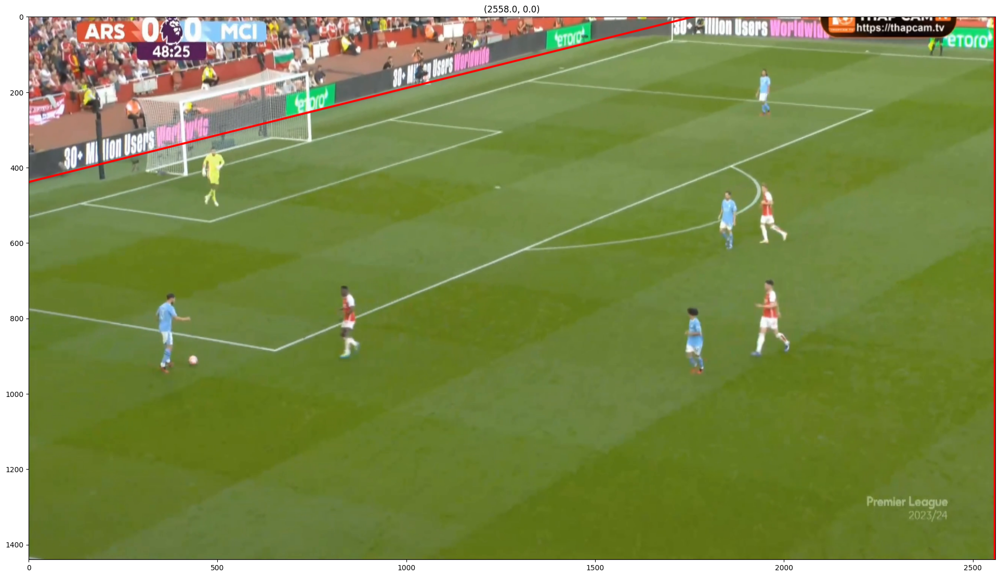

In [8]:
lines = cv2.HoughLines(edges, 1, np.pi / 180, 180)
min_angle_diff_x = 9999
min_x_line = np.NaN
min_angle_diff_y = 9999
min_y_line = np.NaN
min_distance_diff = 9999

temp = cropped_image.copy()
if lines is not None:
    for i in range(0, len(lines)):
        rho = lines[i][0][0]
        theta = lines[i][0][1]
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho

        # Find the points with angles closest to x and y angles found from the convex hull
        if theta < 1 or theta > 2.5:
            ref_angle = y_angle
            angle_diff = np.abs(theta - ref_angle)
            
            if angle_diff < min_angle_diff_y:
                min_angle_diff_y = angle_diff  
                min_y_line = lines[i]  
            
        else:
            ref_angle = x_angle
            angle_diff = np.abs(theta - ref_angle)
            distance_diff = np.abs(rho - 30)
            
            if angle_diff <= min_angle_diff_x:
                #print(angle_diff, rho, x_angle_radian)
                min_angle_diff_x = angle_diff  
                min_distance_diff = distance_diff
                min_x_line = lines[i]
            
#         points = line_end_points_on_image(rho, theta, (orig_h, orig_w))
#         if len(points) == 2:
#             pt1, pt2 = points
#             pt2 = (int(x0 - orig_w*(-b)), int(y0 - orig_w*(a)))
#             cv2.line(temp, start_coord, min_x_coord, (255,0,255), 3, cv2.LINE_AA)
#             cv2.line(temp, pt1, pt2, (0,0,255), 3, cv2.LINE_AA)

# plt.figure()
# plt.imshow(temp[:,:,::-1])

        # De-duplicate lines
        # if not unified_lines:
        #     unified_lines.append((rho, theta))
        # else:
        #     matched = False
        #     for u_rho, u_theta in unified_lines:
        #         if abs(u_rho - rho) < rho_threshold and abs(u_theta - theta) < theta_threshold:
        #             average_rho = (u_rho + rho) / 2
        #             average_theta = (u_theta + theta) / 2
        #             unified_lines[unified_lines.index((u_rho, u_theta))] = (average_rho, average_theta)
        #             matched = True
        #             break
        #     if not matched:
        #         unified_lines.append((rho, theta))

temp = cropped_image.copy()
for i in range(2):
    line = [min_x_line, min_y_line][i][0]
    draw_distance = [orig_w, orig_h][i] 
    print(line)
    rho, theta = line
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a * rho
    y0 = b * rho
    pt1 = (int(x0 + draw_distance*(-b)), int(y0 + draw_distance*(a)))
    pt2 = (int(x0 - draw_distance*(-b)), int(y0 - draw_distance*(a)))
    print(pt1, pt2)
    cv2.line(temp, pt1, pt2, (0,0,255), 3, cv2.LINE_AA)
plt.figure()
plt.imshow(temp[:,:,::-1])
plt.title((rho, theta))
min_angle_diff_x, min_angle_diff_y

### Probabilistic Hough Transform

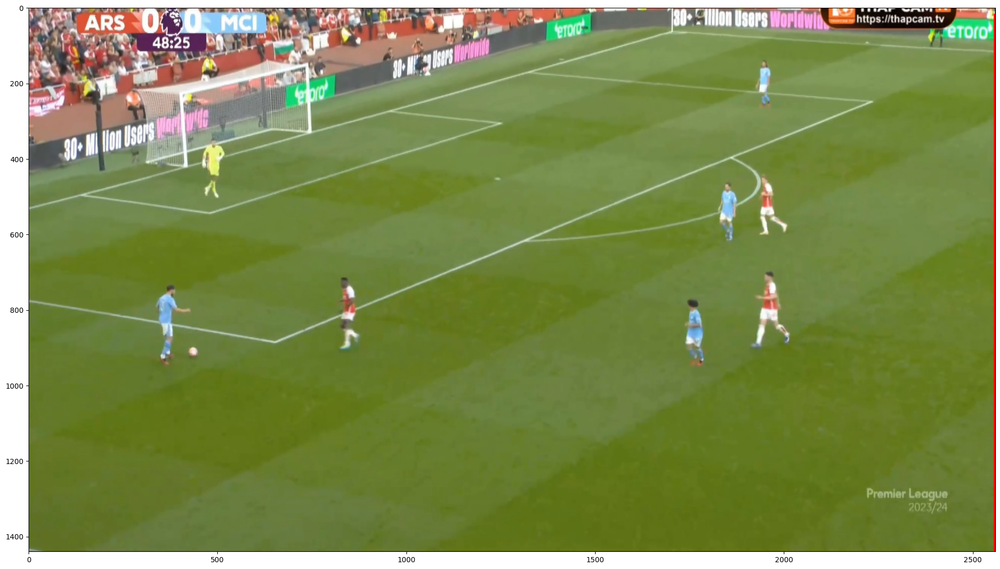

In [16]:
# # Vertical lines
# vertical_lines = cv2.HoughLinesP(
#     edges, 1, np.pi, threshold=30, minLineLength=50, maxLineGap=0)

# # Horizontal lines
# horizontal_lines = cv2.HoughLinesP(
#     edges, 1, np.pi / 2, threshold=30, minLineLength=50, maxLineGap=0)

# # Diagonal lines
# diagonal_lines = cv2.HoughLinesP(
#     edges, 1, np.pi / 4, threshold=30, minLineLength=20, maxLineGap=0)

#lines = np.concatenate([vertical_lines, horizontal_lines])

lines = cv2.HoughLinesP(
     edges, 1, np.pi / 180, threshold=30, minLineLength=50, maxLineGap=0)

temp = cropped_image.copy()
if lines is not None:
    for line in lines:
        cv2.line(temp, (line[0][0], line[0][1]), (line[0][2], line[0][3]), (0,0,255), 3, cv2.LINE_AA)
plt.figure()
plt.imshow(temp[:,:,::-1])

[array([[2558, 1439, 2558,   18]], dtype=int32)]

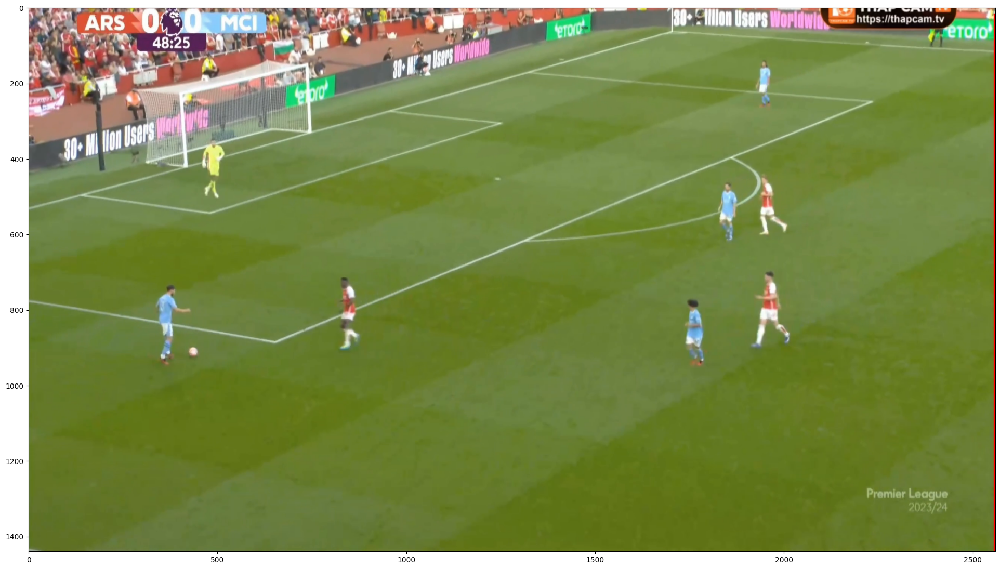

In [10]:
# Stitch the small lines into one long line
final_lines = []
bundler = HoughBundler(min_distance=1000, min_angle=30)
lines = bundler.process_lines(sorted(lines, key=lambda x: x[0][0]))
temp = cropped_image.copy()
if lines is not None:
    for line in lines:
        pt1, pt2 = np.array([line[0][0], line[0][1]]), np.array([line[0][2], line[0][3]])
        _, length = angle_and_distance(pt1, pt2)
        if length > 400:
            cv2.line(temp, pt1, pt2, (0, 0, 255), 4, cv2.LINE_AA)
            final_lines.append(line)

plt.figure()
plt.imshow(temp[:,:,::-1])

final_lines

In [11]:
# Calculate all points of intersection:
axis_lines = [np.array([[0, 0, orig_w, 0]]), np.array([[0, 0, 0, orig_h]]),
              np.array([[0, orig_h, orig_w, orig_h]]), np.array([[orig_w, 0, orig_w, orig_h]])]

all_lines = final_lines + axis_lines

intersection_points_dict = {}

for i in range(len(final_lines)):
    line1 = final_lines[i]
    print(line1)
    intersection_points_list = []
    for j in range(len(all_lines)):
        if i == j:
            continue
        line2 = all_lines[j]

        intersection_point = intersection_cartesian(line1, line2)
        if (intersection_point is not None and 
            0 <= intersection_point[0][0] <= orig_w and 
            0 <= intersection_point[0][1] <= orig_h):
        #if intersection_points is not None:
            print(line2, intersection_point)  
            intersection_points_list.append(intersection_point)
    intersection_points_dict[i] = intersection_points_list
        

[[2558 1439 2558   18]]
[[   0    0 2560    0]] [[2558    0]]
[[   0 1440 2560 1440]] [[2558 1440]]


[[2558 1439]] [[2558    0]] 1439.0
[[2558 1439]] [[2558 1440]] 1.0
[array([2558, 1440])]
[[2558   18]] [[2558    0]] 18.0
[[2558   18]] [[2558 1440]] 1422.0
[array([2558, 1440]), array([2558,    0])]


[array([[2558, 1440, 2558,    0]])]

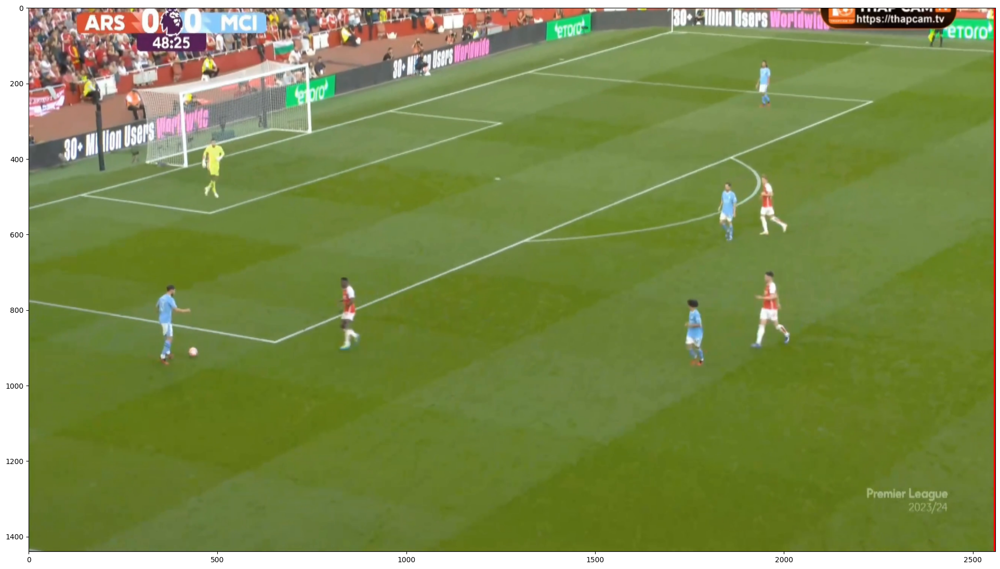

In [12]:
fixed_lines = []
temp = cropped_image.copy()
for i in range(len(final_lines)):
    line = final_lines[i]
    pt1 = np.array([[line[0][0], line[0][1]]])
    pt2 = np.array([[line[0][2], line[0][3]]])
    intersection_points_list = intersection_points_dict[i]
    new_line = []
    for point in [pt1, pt2]:
        min_distance = 400
        chosen_point = pt1
        for intersection_point in intersection_points_list:
            _, distance = angle_and_distance(point[0], intersection_point[0])
            print(point, intersection_point, distance)

            if distance < min_distance:
                min_distance = distance
                chosen_point = intersection_point
            
        new_line.append(chosen_point[0])
        print(new_line)
    new_line = np.array(new_line).reshape(1, -1)
    fixed_lines.append(new_line)

    pt1, pt2 = np.array([new_line[0][0], new_line[0][1]]), np.array([new_line[0][2], new_line[0][3]])
    cv2.line(temp, pt1, pt2, (0, 0, 255), 4, cv2.LINE_AA)

plt.figure()
plt.imshow(temp[:,:,::-1])  
fixed_lines